In [2]:
import detect_lanes
from functions import *
from parameters import *
from classes import *
import time

In [3]:
img_path =  './test_images/test1.jpg'
img = read_img(img_path)

In [4]:
weights_path = os.path.join("yolo","yolov3.weights")
config_path = os.path.join("yolo","yolov3.cfg")

net = cv2.dnn.readNetFromDarknet( config_path,weights_path )
# net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
# net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)
names = net.getLayerNames()
(h,w) = img.shape[:2]
net.getUnconnectedOutLayers()


array([200, 227, 254])

In [5]:
(h,w)

(720, 1280)

In [6]:
layers_names = [names[int(i)-1] for i in net.getUnconnectedOutLayers()]
layers_names


['yolo_82', 'yolo_94', 'yolo_106']

In [7]:
blob = cv2.dnn.blobFromImage(img , 1/255.0 , (416 , 416), crop = False , swapRB = False)
net.setInput(blob)

#calculate the runtime of algorithm 

start_t = time.time()
layers_output = net.forward(layers_names)
print("A forword pass through yolov3 took{}".format(time.time()-start_t))

A forword pass through yolov3 took0.40809106826782227


In [8]:
layers_output[0].shape

(507, 85)

In [9]:
boxes = []
confidences = []
classIDs = []
for output in layers_output:
    for detection in output:
        scores = detection[5:]
        classID = np.argmax(scores)
        confidence = scores[classID]
        
        if(confidence >0.85):
            box = detection[:4] * np.array([w, h , w, h])
            bx , by, bw, bh = box.astype("int")
            
            
            x = int(bx - (bw / 2 ))
            y = int(by - (bh / 2 ))
                    
            boxes.append([x , y ,int(bw), int(bh)])
            confidences.append(float(confidence))
            classIDs.append(classID)       
        
        
        

In [10]:
boxes

[[814, 412, 128, 82],
 [812, 414, 131, 78],
 [822, 415, 129, 79],
 [1056, 403, 213, 103]]

In [11]:
idxs = cv2.dnn.NMSBoxes(boxes, confidences , 0.8, 0.8)


In [12]:
labels_path = os.path.join("yolo","coco.names" )
labels = open(labels_path).read().strip().split("\n")
labels


['person',
 'bicycle',
 'car',
 'motorbike',
 'aeroplane',
 'bus',
 'train',
 'truck',
 'boat',
 'traffic light',
 'fire hydrant',
 'stop sign',
 'parking meter',
 'bench',
 'bird',
 'cat',
 'dog',
 'horse',
 'sheep',
 'cow',
 'elephant',
 'bear',
 'zebra',
 'giraffe',
 'backpack',
 'umbrella',
 'handbag',
 'tie',
 'suitcase',
 'frisbee',
 'skis',
 'snowboard',
 'sports ball',
 'kite',
 'baseball bat',
 'baseball glove',
 'skateboard',
 'surfboard',
 'tennis racket',
 'bottle',
 'wine glass',
 'cup',
 'fork',
 'knife',
 'spoon',
 'bowl',
 'banana',
 'apple',
 'sandwich',
 'orange',
 'broccoli',
 'carrot',
 'hot dog',
 'pizza',
 'donut',
 'cake',
 'chair',
 'sofa',
 'pottedplant',
 'bed',
 'diningtable',
 'toilet',
 'tvmonitor',
 'laptop',
 'mouse',
 'remote',
 'keyboard',
 'cell phone',
 'microwave',
 'oven',
 'toaster',
 'sink',
 'refrigerator',
 'book',
 'clock',
 'vase',
 'scissors',
 'teddy bear',
 'hair drier',
 'toothbrush']

In [13]:
new_img = read_img(img_path)
for i in idxs.flatten():
# for i in range(len(boxes)):
    (x,y)= [boxes[i][0] , boxes[i][1]]
    (W,H) = [boxes[i][2] , boxes[i][3]]
    cv2.rectangle(new_img, (x,y),(x + W , y + H), (0,255,255) , 2)
    cv2.putText(new_img , f'{i}{labels[classIDs[i]]} {round(confidences[i],3)}' , (x , y-5) , cv2.FONT_HERSHEY_SIMPLEX, 1 , (0, 139,139), 2)
    
    

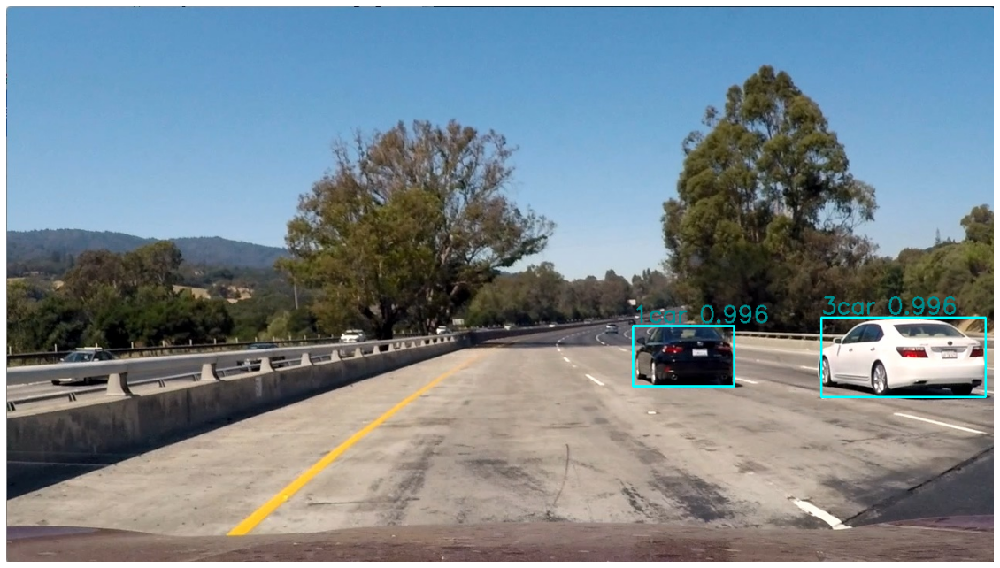

In [14]:
plt.figure(figsize=( 20 , 20))
plt.axis ('off')
plt.imshow(new_img)

In [15]:
def yolo_pipeline(img):
    
    blob = cv2.dnn.blobFromImage(img , 1/255.0 , (416 , 416), crop = False , swapRB = False)
    net.setInput(blob)
    # start_t = time.time()
    layers_output = net.forward(layers_names)
    # print("A forword pass through yolov3 took{}".format(time.time()-start_t))
    
    boxes = []
    confidences = []
    classIDs = []
    for output in layers_output:
        for detection in output:
            scores = detection[5:]
            classID = np.argmax(scores)
            confidence = scores[classID]
            
            # if(confidence >0.85):
            box = detection[:4] * np.array([w, h , w, h])
            bx , by, bw, bh = box.astype("int")
            
            
            x = int(bx - (bw / 2 ))
            y = int(by - (bh / 2 ))
                    
            boxes.append([x , y ,int(bw), int(bh)])
            confidences.append(float(confidence))
            classIDs.append(classID)    
    
    idxs = cv2.dnn.NMSBoxes(boxes, confidences ,  score_threshold=0.4,nms_threshold=0.2)
    # print(len(boxes))
    # print(len(confidences))
    # print(idxs)
    if len(idxs) == 0:
        return img
    for i in idxs.flatten():
        # print(boxes[i] , labels[classIDs[i]] , confidences[i])
        
            # draw_bounding_box(img, box, labels=["Cat", "Felis Catus"], color='blue')

        (x,y)= [boxes[i][0] , boxes[i][1]]
        (W,H) = [boxes[i][2] , boxes[i][3]]

        cv2.rectangle(img,
                      (x,y),
                      (x + W , y + H),
                      (230,126,34),
                       2 )
        
        cv2.putText(img , f'{labels[classIDs[i]]} {round(confidences[i],1)}' , (x , y-3) ,cv2.FONT_HERSHEY_DUPLEX, 0.5 , (230,126,34), 1 ,cv2.LINE_AA )
    return img

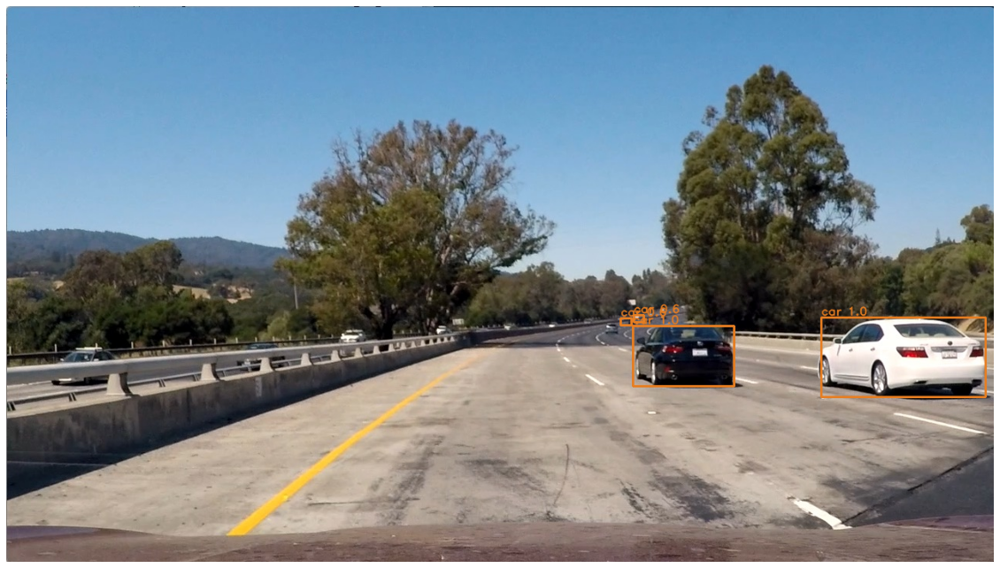

In [16]:
img  =read_img(img_path)
new_img = yolo_pipeline(img)
plt.figure( figsize=  (20 , 20))
plt.axis('off')
plt.imshow(new_img)
plt.show()

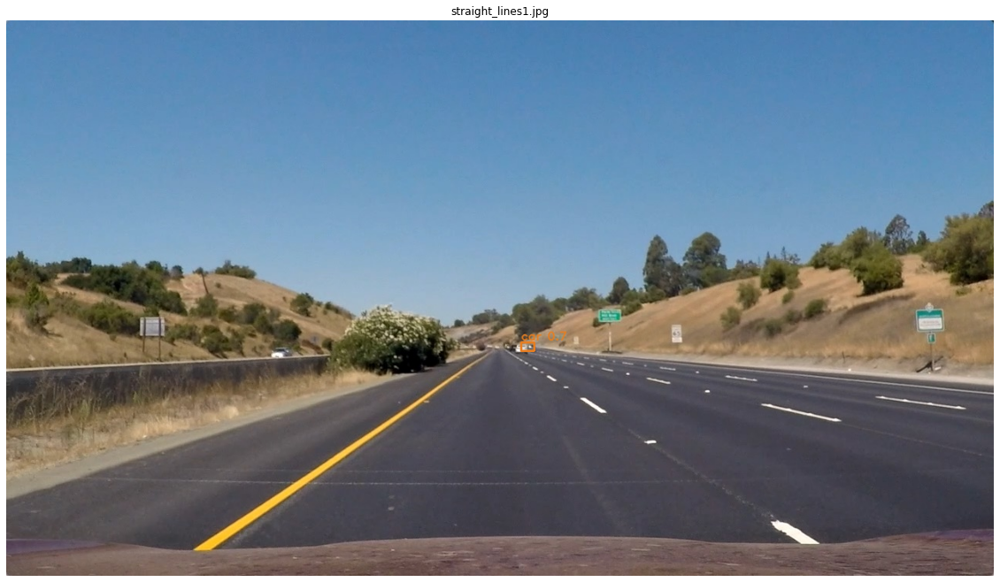

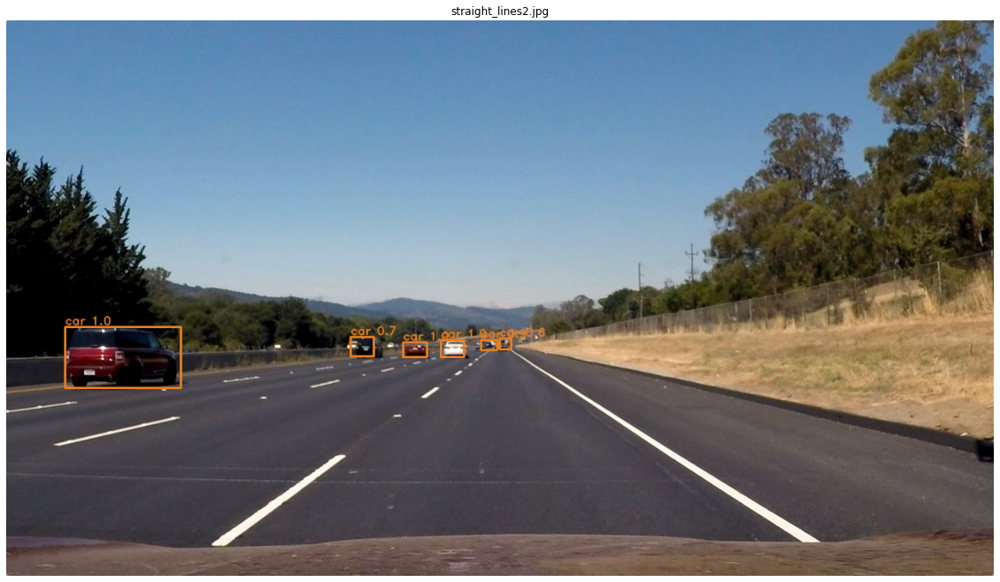

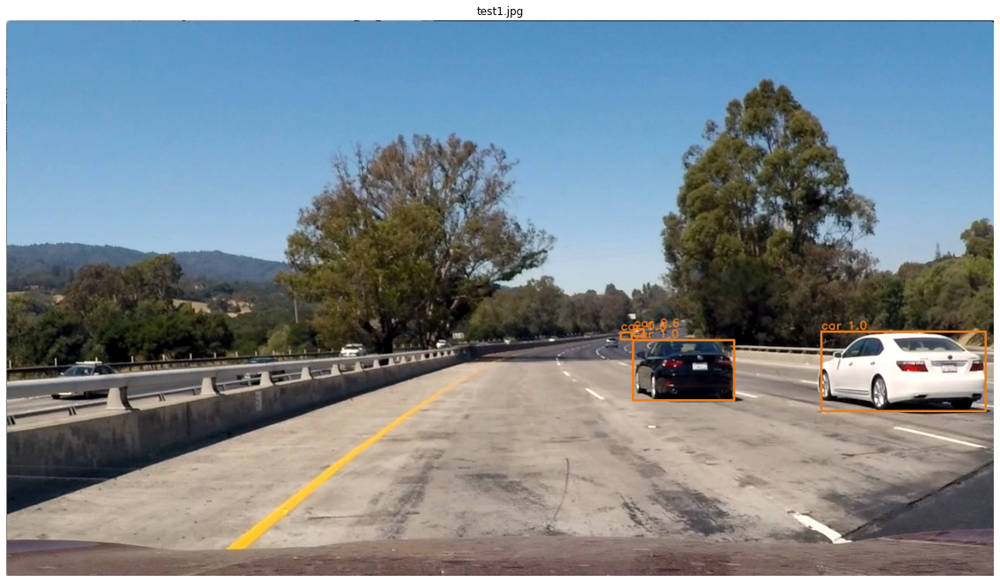

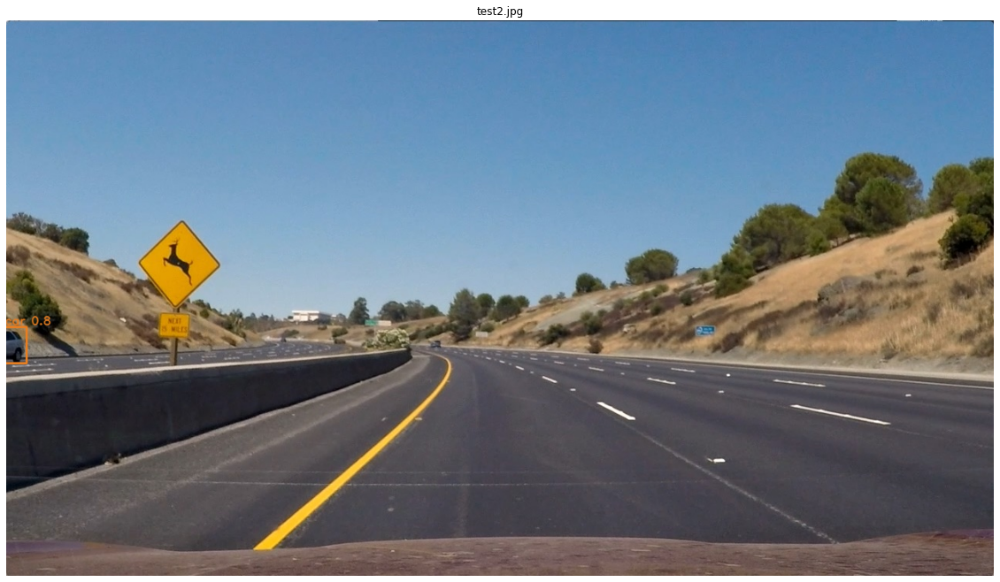

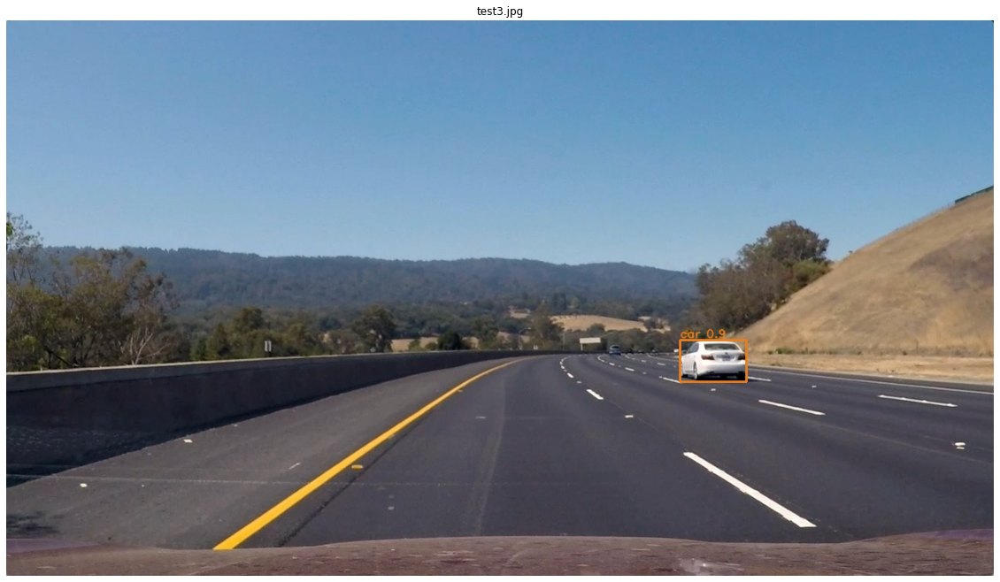

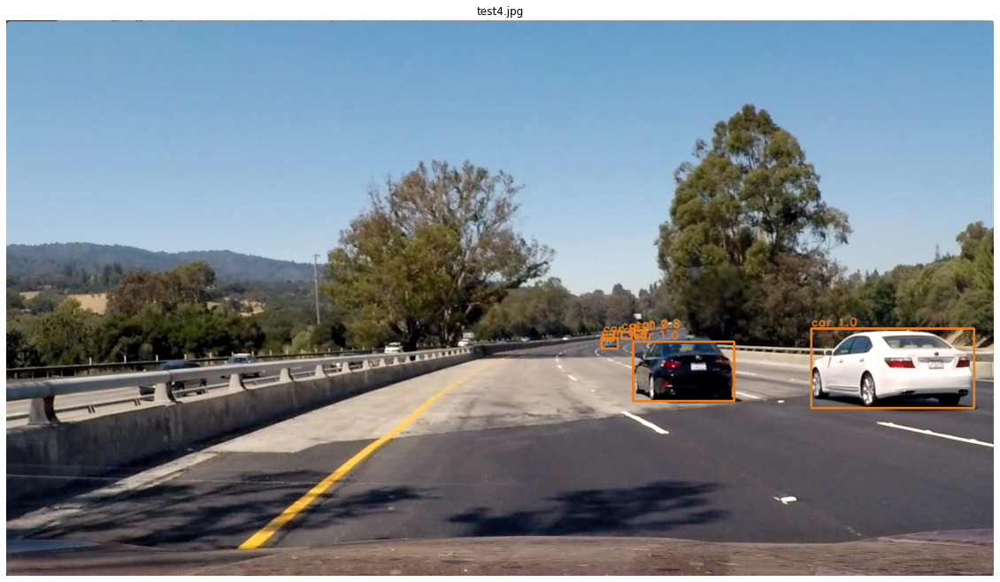

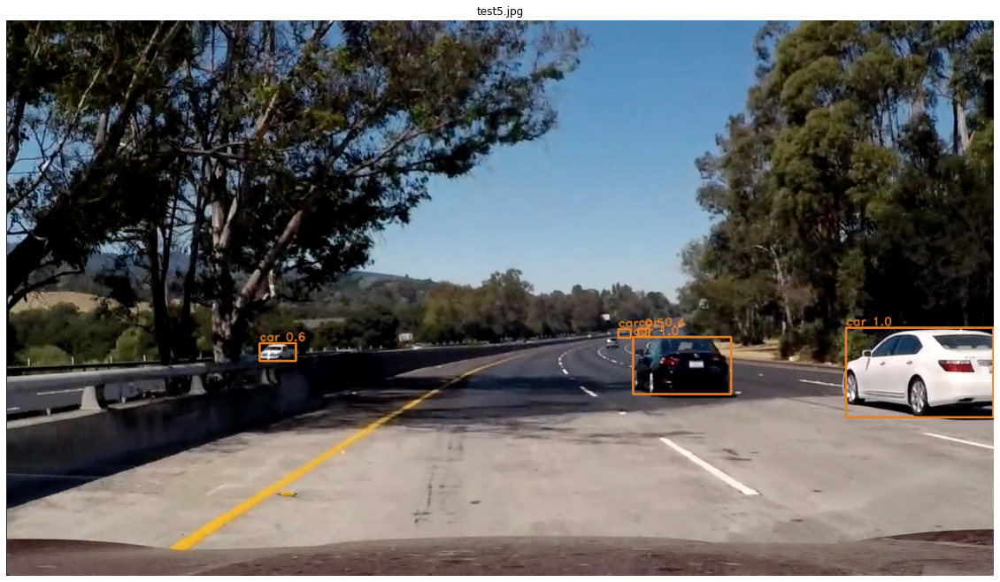

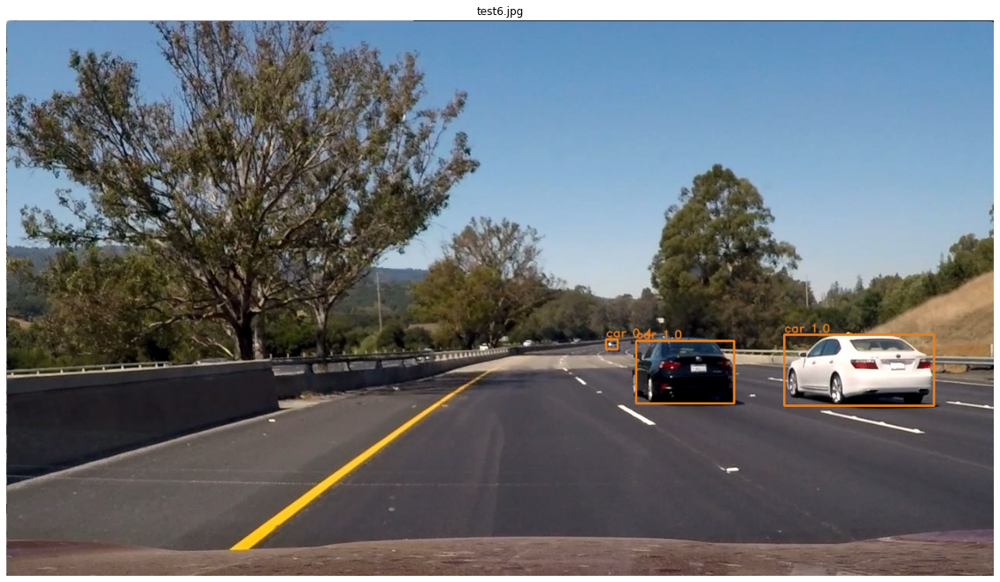

In [17]:
for path in os.listdir('./test_images'):
    img = read_img(os.path.join('./test_images',path))
    new_img = yolo_pipeline(img)
    plt.figure( figsize=  (20 , 20))
    plt.axis('off')
    plt.imshow(new_img)
    plt.title(path)
    plt.show()


In [18]:
img = read_img(os.path.join('./test_images',path))


In [19]:
input_path = 'project_video.mp4'
clip1 = VideoFileClip(input_path)
out_path =f'{input_path.split(".")[0]}_car_detection.mp4'
clip = clip1.fl_image(yolo_pipeline)

clip.write_videofile(out_path, audio=False)
print(f'output saved to >> {out_path}')



Moviepy - Building video project_video_car_detection.mp4.
Moviepy - Writing video project_video_car_detection.mp4



Moviepy - Done !
Moviepy - video ready project_video_car_detection.mp4
output saved to >> project_video_car_detection.mp4
